<a href="https://colab.research.google.com/github/jennifer060697/AI15_Project/blob/main/project2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Project 2
## Topic : 기본 건강 검진 결과를 기반으로한 녹내장 발병 가능성 예측
## 문제 정의 :    
녹내장은 전 세계적으로 회복할 수 없는 가장 중요한 실명의 3대 원인 중 하나이다.

초기에는 뚜렷한 증상이 없어 알아차리기 어렵고 병증이 꽤 심해져 실명에 이를 무렵에서야 시야가 흐릿해지는 증상이 나타나는 특징이 있다. 녹내장을 ‘소리 없는 시력 도둑’으로 부르는 이유다.

녹내장은 조기에 발견해 적절히 치료하면 실명하지 않는다. 일단 녹내장이 진행되면 치료를 받더라도 시야와 시력을 되돌릴 수 없는 만큼 조기에 발견하는 것이 무엇보다 중요하다.

성별, 연령, 좌우측시력, 고혈압, 당뇨라는 기본 검진 내역들과 주요 실명 원인 당뇨망막병증의 진료 여부로 녹내장 가능성을 예측하는 모델을 만들어 녹내장 위험군을 분류하고 초기에 병을 진단할 수 있도록 보조하는 모델을 만드는걸 이번 프로젝트의 목적으로 한다.  
  
## Data Set : 2015~2016년 일반검진 및 생애전환기 건강검진 데이터 1,000,000건

## Feature Explanation :  
SEX : 성별 (1:남성, 2:여성) type int  
AGE_G : 연령 (1 : 20세-24세, 2 : 25세-26세, 3 : 27세-28세, ... , 27 : 75세 이상) type int  
VA_LT : 좌측 시력 (0.1이하는 0.1로 표기, 9.9: 실명) type float  
VA_RT : 우측 시력  
HTN : 고혈압 (I10 - I13, I15) 진료여부 (1:있음, 2:없음)  
DM : 당뇨병 (E10 - E14) 진료여부 (1:있음, 2:없음)  
DR : 당뇨망막병증 진료여부 (1:있음, 2:없음)  
GLAUCOMA : 녹내장 (H40 - H42) 진료여부 (1:있음, 2:없음) TARGET COLUMN  
    - 2012~2016년 간 진료여부 주상병 및 부상병(1개)  

## ML direction : Classification Problem  

## 가설 : 성별, 연령, 시력, 고혈압, 당뇨라는 한정적인 데이터로 녹내장 위험군을 분류할 수 있다.





In [1]:
import sys

if "google.colab" in sys.modules:
    from google.colab import drive
    drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
!pip install category_encoders

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 69 kB 3.5 MB/s 


In [3]:
# import

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import StandardScaler
from sklearn.metrics import plot_confusion_matrix
from sklearn.metrics import roc_curve, roc_auc_score
from category_encoders import OrdinalEncoder
from sklearn.impute import SimpleImputer
from sklearn.linear_model import LinearRegression
from sklearn.compose import TransformedTargetRegressor
from sklearn.model_selection import train_test_split

In [4]:
data = pd.read_csv("/content/drive/MyDrive/AI15/국가건강검진_시력데이터.csv")

In [5]:
def Xysplit(df) :
  target = 'GLAUCOMA'
  X = df.drop(columns = [target])
  y = df[target]
  return X,y

In [6]:
x_data, y_data = Xysplit(data)

In [93]:
x_train, x_test, y_train, y_test = train_test_split(x_data, y_data, stratify=y_data, test_size=0.2, random_state=42)

In [8]:
y_test.value_counts(normalize = True) # 1 : 약 0.14

0    0.861045
1    0.138955
Name: GLAUCOMA, dtype: float64

In [9]:
y_test.value_counts()

0    172209
1     27791
Name: GLAUCOMA, dtype: int64

In [10]:
y_train.value_counts(normalize = True)

0    0.861045
1    0.138955
Name: GLAUCOMA, dtype: float64

In [11]:
y_train.value_counts()

0    688836
1    111164
Name: GLAUCOMA, dtype: int64

## Train set EDA

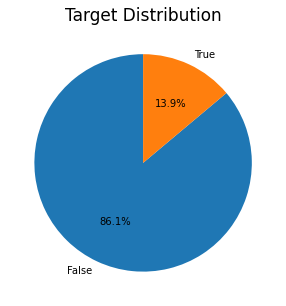

In [12]:
plt.figure(figsize = (5,5))
plt.title("Target Distribution", {'fontsize': 17,} )
plt.pie(y_train.value_counts(), labels = [False,True], autopct='%.1f%%', startangle=90, counterclock=True,)
plt.show()

# 건강검진 결과 녹내장 

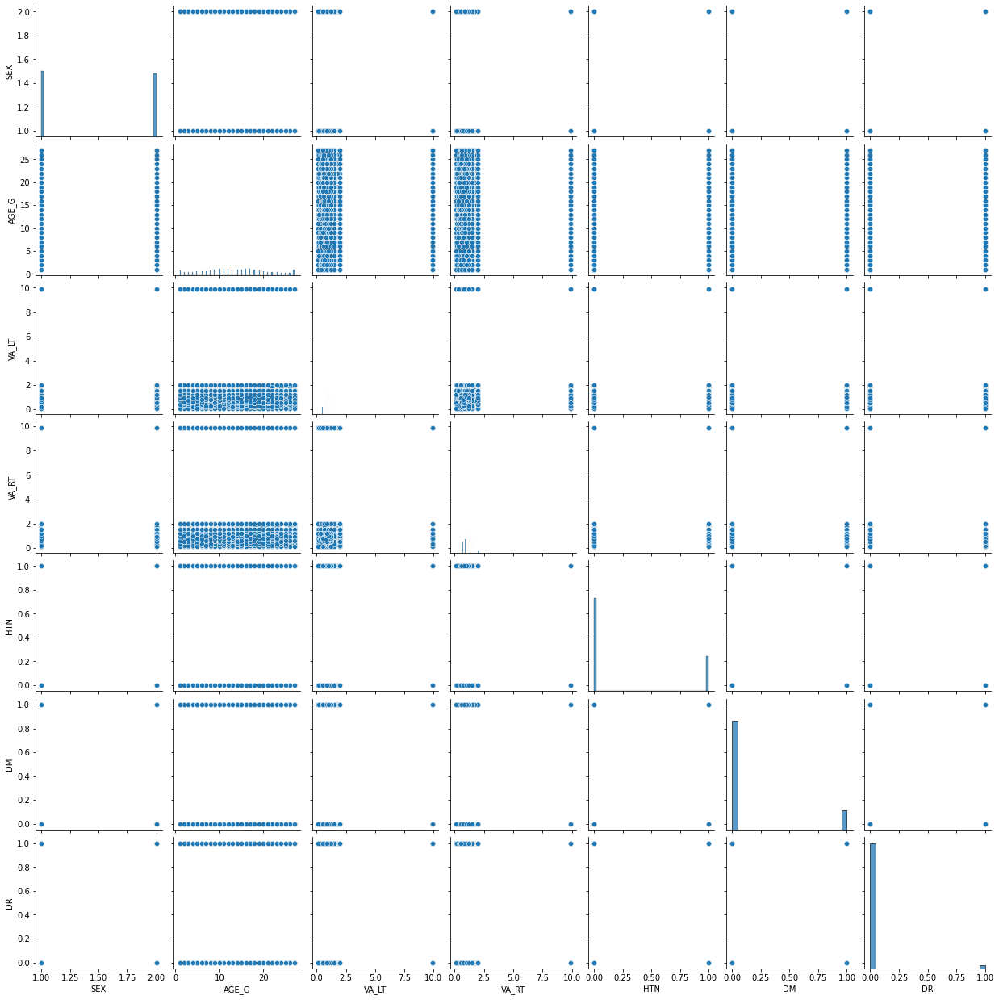

In [13]:
sns.pairplot(x_train) # 바이너리 데이터가 많아서 딱히 뭐가 안보인다. 기각

In [14]:
from pandas.core.groupby.groupby import DataError
from operator import xor
# 완전 실명, 한쪽 실명 컬럼 추가
# 의문점
# 시력 컬럼에 이상치 9.9 로 이미 단서가 주어져있긴하다. 이걸 컬럼을 쪼개는게 의미가 있는가
# 모델에 따라 다를것은 확실해보인다.
# 트리 기반의 경우 어떤 차이를 보일지 확인해보면 좋을 것 같다.

def add_columns(data) :

  # 평균 시력 : 실명값은 0 으로 변경하여 평균
  # 실명 시력 0으로 조정
  left_sight = data['VA_LT']
  right_sight = data['VA_RT']
  left_sight = left_sight.replace({9.9 : 0})
  right_sight = right_sight.replace({9.9 : 0})
  mean_sight = (left_sight+right_sight)/2
  data["mean_sight"] = mean_sight
  data["VA_LT"] = left_sight
  data["VA_RT"] = right_sight

  left_blind = data['VA_LT'] == 0
  right_blind = data['VA_RT'] == 0
  Both_Blind = []
  One_Blind = []
  for l,r in zip(left_blind, right_blind) :
    Both_Blind.append(int(l and r))
    One_Blind.append(int(l ^ r))
  # 완전 실명
  data['Both_Blind'] = Both_Blind
  # 한쪽 실명
  data['One_Blind'] = One_Blind
  data = data.replace({True : 1, False : 0})

  # 좌우 시력차이(절대값)
  data["sight_difference"] = abs(data["VA_LT"] - data["VA_RT"])

  return data

In [15]:
x_train = add_columns(x_train)

In [16]:
print(x_train["Both_Blind"].value_counts())
print(x_train["One_Blind"].value_counts(normalize = True))

0    799479
1       521
Name: Both_Blind, dtype: int64
0    0.993634
1    0.006366
Name: One_Blind, dtype: float64


In [17]:
# xy_train
xy_train = x_train.copy()
xy_train["GLAUCOMA"] = y_train

In [18]:
# 폰트 지정
# 'serif' 'sans-serif' 'cursive' 'fantasy' 'monospace'
# 제목
font1 = {'family': 'serif',
         'color': 'black',
         'weight': 'bold',
         'size': 20
         }

font2 = {'family': 'fantasy',
         'color': 'red',
         'weight': 'normal',
         'size': 'xx-large'
         }
 
# 축
font3 = {'family': 'monospace',
         'color': 'black',
         'weight': 'normal',
         'size': 15
         }

In [19]:
xy_train["Both_Blind"].sum()

521

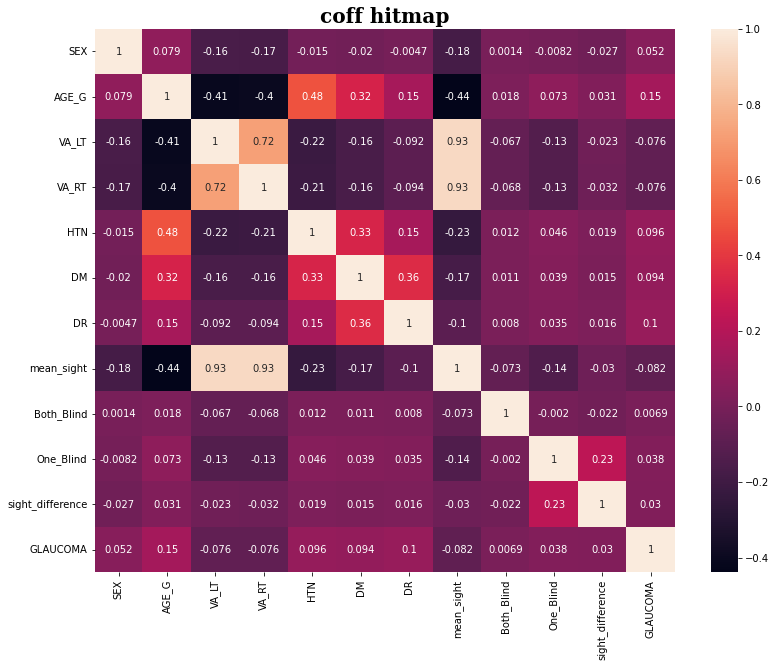

In [20]:
corr = xy_train.corr()  # 자동으로 수치형 데이터 간의 correlation coefficient를 계산해 줍니다.
plt.figure(figsize = (13,10))
plt.title("coff hitmap", fontdict = font1)
sns.heatmap(corr, annot=True)
plt.show()

# 나이 - 고혈압
# 나이 - 당뇨
# 나이 - 녹내장
# 녹내장 - 당뇨머시기


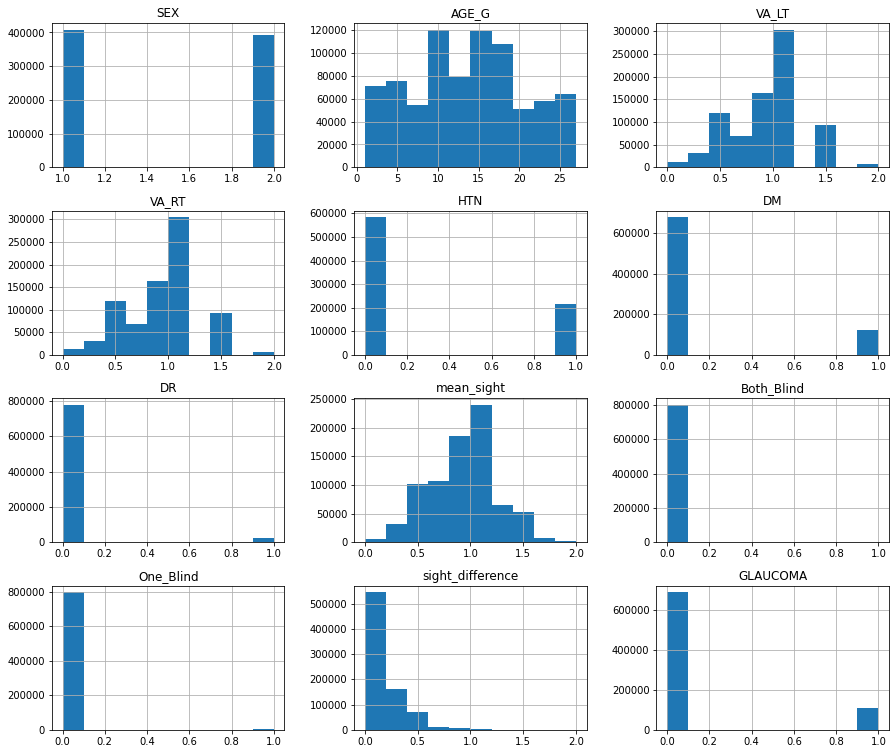

In [21]:
# 전체 히스토그램
xy_train.hist(figsize = (15,13))
plt.show()

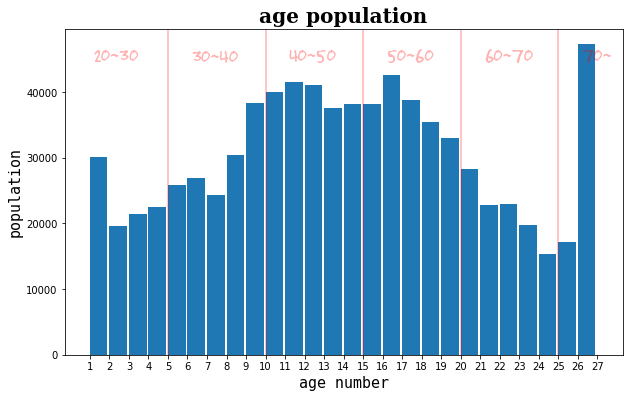

In [22]:
# 나이별 겸진 인구 수 hist

# 20대, 30대, 40대, 50대, 60대, 70대 이상
# 1~4, 5~9, 10~14, 15~19, 20~24, 25~27 

plt.figure(figsize = (10,6))
plt.title("age population", fontdict = font1)
temp = xy_train["AGE_G"]
plt.hist(temp, bins = 26, width = 0.9)
plt.xlabel('age number', fontdict=font3)
plt.ylabel('population', fontdict=font3)
plt.xticks(range(1,28))

plt.axvline(x = 5, color = 'r', alpha = 0.3)
plt.text(1.2, 45000, "20~30", fontdict = font2, alpha = 0.3)

plt.axvline(x = 10, color = 'r', alpha = 0.3)
plt.text(6.2, 45000, "30~40", fontdict = font2, alpha = 0.3)

plt.axvline(x = 15, color = 'r', alpha = 0.3)
plt.text(11.2, 45000, "40~50", fontdict = font2, alpha = 0.3)

plt.axvline(x = 20, color = 'r', alpha = 0.3)
plt.text(16.2, 45000, "50~60", fontdict = font2, alpha = 0.3)

plt.axvline(x = 25, color = 'r', alpha = 0.3)
plt.text(21.2, 45000, "60~70", fontdict = font2, alpha = 0.3)

plt.text(26.2, 45000, "70~", fontdict = font2, alpha = 0.3)

plt.show()

In [23]:
# 나이별 녹내장 추이

temp = xy_train[["AGE_G", "GLAUCOMA"]]
age_gla_sum = temp.groupby('AGE_G').sum()
age_gla_count = temp.groupby('AGE_G').count()
age_gla= age_gla_sum
age_gla["count"] = age_gla_count["GLAUCOMA"]
age_gla["ratio"] = age_gla["GLAUCOMA"] / age_gla["count"] * 100

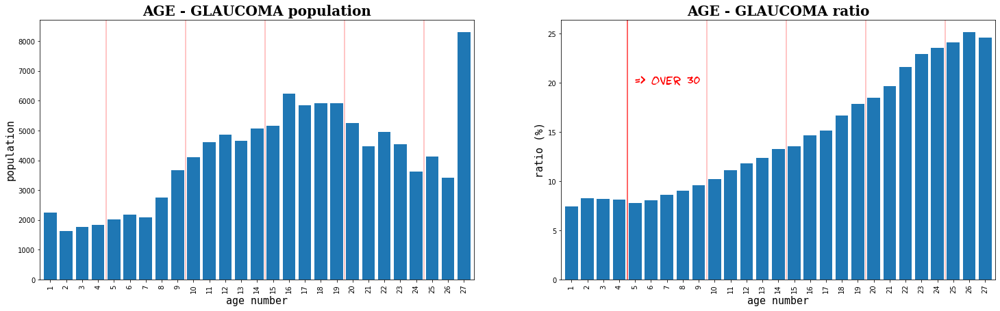

In [24]:
plt.figure(figsize = (25,7))

plt.subplot(1,2,1)
plt.title("AGE - GLAUCOMA population", fontdict = font1)
age_gla["GLAUCOMA"].plot(kind = 'bar', width = 0.8)
plt.xlabel('age number', fontdict=font3)
plt.ylabel('population', fontdict=font3)

plt.axvline(x = 3.5, color = 'r', alpha = 0.3)
plt.axvline(x = 8.5, color = 'r', alpha = 0.3)
plt.axvline(x = 13.5, color = 'r', alpha = 0.3)
plt.axvline(x = 18.5, color = 'r', alpha = 0.3)
plt.axvline(x = 23.5, color = 'r', alpha = 0.3)


plt.subplot(1,2,2)
plt.title("AGE - GLAUCOMA ratio", fontdict = font1)
age_gla["ratio"].plot(kind = 'bar', width = 0.8)
plt.text(4, 20, "=> over 30", fontdict = font2)
plt.xlabel('age number', fontdict=font3)
plt.ylabel('ratio (%)', fontdict=font3)

plt.axvline(x = 3.5, color = 'r', alpha = 0.8)
plt.axvline(x = 8.5, color = 'r', alpha = 0.3)
plt.axvline(x = 13.5, color = 'r', alpha = 0.3)
plt.axvline(x = 18.5, color = 'r', alpha = 0.3)
plt.axvline(x = 23.5, color = 'r', alpha = 0.3)

plt.show()

In [25]:
def age_columns_plot(feature, title1, title2) :
  temp = xy_train[["AGE_G", feature]]
  age_feat_sum = temp.groupby('AGE_G').sum()
  age_feat_count = temp.groupby('AGE_G').count()
  age_feat = age_feat_sum
  age_feat["count"] = age_feat_count[feature]
  age_feat["ratio"] = age_feat[feature] / age_feat["count"] * 100

  plt.figure(figsize = (25,7))

  plt.subplot(1,2,1)
  plt.title(title1, fontdict = font1)
  age_feat[feature].plot(kind = 'bar', width = 0.8)
  plt.xlabel('age number', fontdict=font3)
  plt.ylabel('population', fontdict=font3)

  plt.subplot(1,2,2)
  plt.title(title2, fontdict = font1)
  age_feat["ratio"].plot(kind = 'bar', width = 0.8)
  plt.xlabel('age number', fontdict=font3)
  plt.ylabel('ratio (%)', fontdict=font3)
  plt.show()

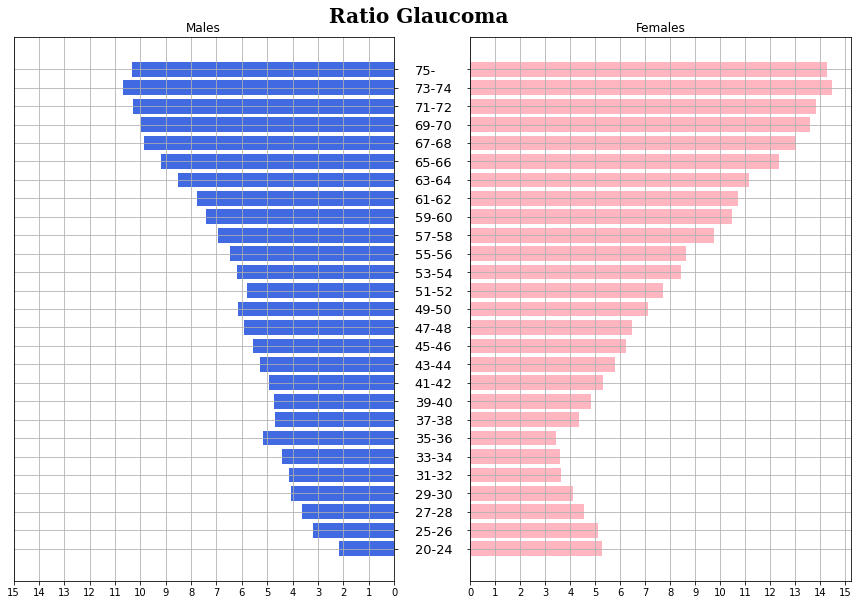

In [26]:
#define x and y limits

temp = xy_train[['SEX','AGE_G','GLAUCOMA']]
gtemp = temp.groupby(['SEX', 'AGE_G']).sum()
gtemp2 = gtemp.iloc[27:,:]

gtemp = gtemp.iloc[0:27,:]
age = ['20-24','25-26','27-28','29-30','31-32','33-34','35-36','37-38','39-40','41-42','43-44','45-46','47-48','49-50','51-52','53-54','55-56','57-58','59-60','61-62','63-64','65-66','67-68','69-70','71-72','73-74','75-']

y = range(0, len(gtemp2))
x_male = gtemp['GLAUCOMA'].reset_index()['GLAUCOMA']
x_female = gtemp2['GLAUCOMA'].reset_index()['GLAUCOMA']

x_male = x_male/age_gla_sum['count'].reset_index(drop = True) * 100
x_female = x_female/age_gla_sum['count'].reset_index(drop = True) * 100

#define plot parameters
fig, axes = plt.subplots(ncols=2, sharey=True, figsize=(15, 10))

#specify background color and plot title
#fig.patch.set_facecolor('xkcd:light grey')
plt.figtext(.5,.9,"Ratio Glaucoma", fontdict = font1, ha='center')
    
#define male and female bars
axes[0].barh(y, x_male, align='center', color='royalblue')
axes[0].set(title='Males')
axes[1].barh(y, x_female, align='center', color='lightpink')
axes[1].set(title='Females')

#adjust grid parameters and specify labels for y-axis
axes[0].grid()
axes[1].grid()
axes[1].set(xticks = range(0,16))

axes[0].invert_xaxis()
axes[0].yaxis.tick_right()
axes[0].set(yticks=y, xticks = range(0,16))
axes[0].tick_params(axis='y', pad=17)
axes[0].yaxis.label.set_size(50)
axes[0].set_yticklabels(labels=age, Fontsize= 13)

#display plot
plt.show()

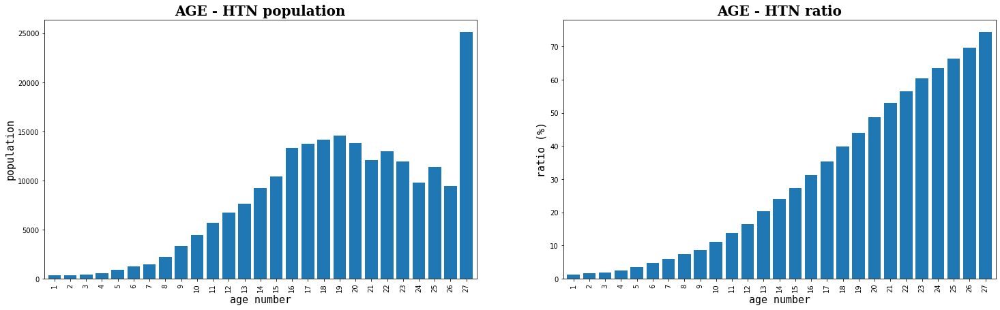

In [27]:
# 나이별 고혈압 추이
age_columns_plot("HTN","AGE - HTN population","AGE - HTN ratio")

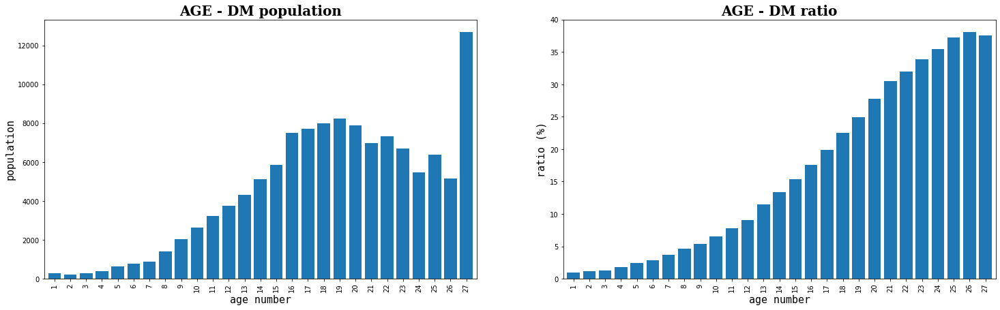

In [28]:
# 나이별 당뇨 추이
age_columns_plot("DM","AGE - DM population","AGE - DM ratio")

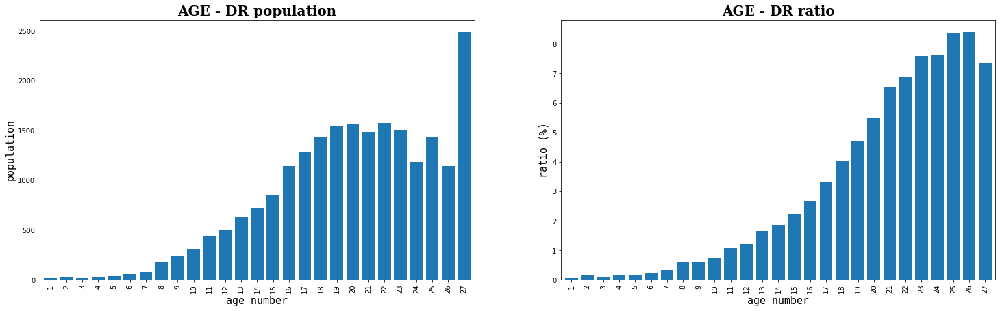

In [29]:
# 나이별 당뇨망막병증 추이
age_columns_plot("DR","AGE - DR population","AGE - DR ratio")

In [30]:
# 녹내장 실명률
glau = (xy_train["GLAUCOMA"]==1).sum()
glau_blind = xy_train.query("((GLAUCOMA == 1) and (One_Blind == 1)) or ((GLAUCOMA == 1) and (Both_Blind == 1))")["SEX"].count()

dr = (xy_train["DR"]==1).sum()
dr_blind = xy_train.query("((DR == 1) and (One_Blind == 1)) or ((DR == 1) and (Both_Blind == 1))")["SEX"].count()

In [31]:
c = xy_train['Both_Blind'].sum() + xy_train['One_Blind'].sum()

In [32]:
print(f"녹내장 진단 수 : {glau}\n녹내장+실명 : {glau_blind}\n녹내장 실명률 : {glau_blind/glau*100}\n")
print(f"당뇨망막병증 진단 수 : {dr}\n당뇨망막병증+실명 : {dr_blind}\n당뇨망막병증 실명률 : {dr_blind/dr*100}\n")
print(f"측정 인구 : 800000 \n실명 : {c}\n실명률 : {c/800000*100}")

녹내장 진단 수 : 111164
녹내장+실명 : 1663
녹내장 실명률 : 1.4959879097549567

당뇨망막병증 진단 수 : 21869
당뇨망막병증+실명 : 542
당뇨망막병증 실명률 : 2.4783940738031003

측정 인구 : 800000 
실명 : 5614
실명률 : 0.70175


In [33]:
# 녹내장 평균 시력
gla_mean_sight = xy_train.query("GLAUCOMA == 1")['mean_sight'].mean()
mean_sight = xy_train['mean_sight'].mean()
print(f"녹내장 평균 시력 : {gla_mean_sight}")
print(f"전체 평균 시력 : {mean_sight}")

녹내장 평균 시력 : 0.8643369256234035
전체 평균 시력 : 0.9307808125


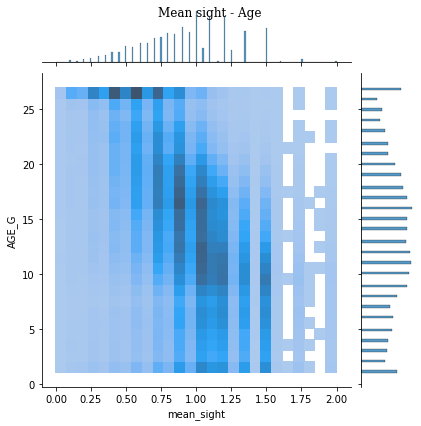

In [34]:
# 평균시력, 나이
rel = sns.jointplot(data=xy_train, x="mean_sight", y="AGE_G", kind="hist", bins = 26)
rel.fig.suptitle("Mean sight - Age", fontdict = font1)
plt.show()

In [35]:
# 양쪽 시력, 나이 기각

import plotly.express as px
fig = px.scatter(xy_train, x="VA_LT", y="VA_RT", color="AGE_G",
                 size='SEX', hover_data=['HTN','GLAUCOMA'], width=800, height=800)
fig.update_layout(
    title={
        'text': "sight - age",
        'y':0.97,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'})
fig.show()

## Train set MODELING

In [141]:
x_train_noval, x_val, y_train_noval, y_val = train_test_split(x_train, y_train, stratify=y_train, test_size=0.2, random_state=42)

### Base Model

In [37]:
y_base = [0]*len(x_train)

In [38]:
from sklearn.metrics import accuracy_score

s = accuracy_score(y_train, y_base)

print(f"Base model 정확도 : {s}")

Base model 정확도 : 0.861045


In [39]:
from sklearn.metrics import f1_score

s = f1_score(y_train, y_base)

print(f"Base model f1 : {s}")

Base model f1 : 0.0


### Logistic

In [99]:
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.model_selection import cross_val_score


logistic = LogisticRegression(class_weight='balanced')
logistic.fit(x_train_noval, y_train_noval)

/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:818: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



LogisticRegression(class_weight='balanced')

In [ ]:
scores = cross_val_score(logistic, x_train, y_train, cv=5, scoring='f1', verbose = 3)

In [42]:
scores

array([0.29945423, 0.29625439, 0.29745601, 0.2966746 , 0.29623875])

In [132]:
y_val_pred_logi = logistic.predict(x_val)

In [133]:
print('logistic val f1:', f1_score(y_val, y_val_pred_logi).round(5))
print("logistic cv f1: ", (scores.mean()).round(5))
print("logistic val accuracy: ", accuracy_score(y_val, y_val_pred_logi))

logistic val f1: 0.2941
logistic cv f1:  0.29711
logistic val accuracy:  0.61953125


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.



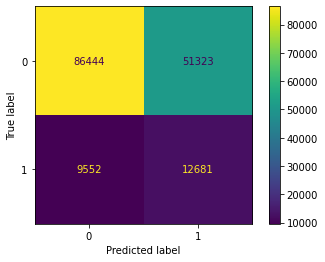

In [45]:
plot_confusion_matrix(logistic, x_val, y_val)  

In [71]:
pd.Series(logistic.coef_[0], logistic.feature_names_in_).sort_values(ascending=False)

DR                  0.791569
One_Blind           0.433685
sight_difference    0.319729
SEX                 0.272053
Both_Blind          0.203599
DM                  0.185681
HTN                 0.119291
AGE_G               0.049330
VA_RT              -0.008921
mean_sight         -0.012405
VA_LT              -0.015889
dtype: float64

False    109010
True      50990
dtype: int64

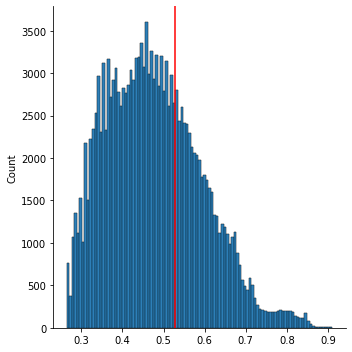

In [134]:
y_pred_proba_logi = logistic.predict_proba(x_val)[:,1]
sns.displot(y_pred_proba_logi)

threshold = 0.528
y_pred = y_pred_proba_logi > threshold

ax = sns.histplot(y_pred_proba_logi)
ax.axvline(threshold, color='red')

pd.Series(y_pred).value_counts()

In [127]:
proba_df = pd.DataFrame({'y_val':y_val, 'y_pred_proba': y_pred_proba_logi, 'ytemp': [0]*len(y_pred_proba_logi)})

In [128]:
proba_df = proba_df.sort_values('y_pred_proba')

In [131]:
fig = px.scatter(proba_df, x="y_pred_proba", y="ytemp", color="y_val",
                  width=800, height=300)
# fig.update_layout(
#     title={
#         'text': "sight - age",
#         'y':0.97,
#         'x':0.5,
#         'xanchor': 'center',
#         'yanchor': 'top'})
fig.show()

In [136]:
y_pred_proba = logistic.predict_proba(x_val)[:,1]
f1 = 0
best_threshold = 0
for threshold in np.arange(0.5,0.6,0.001) :
  y_pred = y_pred_proba > threshold
  nf1 = f1_score(y_val, y_pred)
  if nf1 > f1 :
    f1 = nf1
    best_threshold = threshold
print(best_threshold)

0.528


In [112]:
print('logistic val f1:', f1_score(y_val, y_pred).round(5))
print("logistic val accuracy: ", accuracy_score(y_val, y_pred))

logistic val f1: 0.29559
logistic val accuracy:  0.67763125


In [104]:
from sklearn.metrics import confusion_matrix

In [113]:
confusion_matrix(y_val, y_pred)

array([[97599, 40168],
       [11411, 10822]])

### column drop

In [86]:
x_train_noval_drop = x_train_noval.drop(columns = ['VA_LT','mean_sight','VA_RT'])
x_val_drop = x_val.drop(columns = ['VA_LT','mean_sight','VA_RT'])
x_train_drop = x_train.drop(columns = ['VA_LT','mean_sight','VA_RT'])

In [ ]:
logistic = LogisticRegression(class_weight='balanced')
logistic.fit(x_train_noval_drop, y_train_noval)
y_val_pred = logistic.predict(x_val_drop)
scores = cross_val_score(logistic, x_train_drop, y_train, cv=5, scoring='f1', verbose = 3)

In [97]:
print('logistic val f1:', f1_score(y_val, y_val_pred).round(5))
print("logistic cv f1: ", (scores.mean()).round(5))
print("logistic val accuracy: ", accuracy_score(y_val, y_val_pred))

# 큰 차이 없고 cv 점수 오히려 하락

logistic val f1: 0.29416
logistic cv f1:  0.29711
logistic val accuracy:  0.62025


### K-Nearest Neighbor

In [192]:
from sklearn.neighbors import KNeighborsClassifier

In [193]:
knn = KNeighborsClassifier()
knn.fit(x_train_noval, y_train_noval)

KNeighborsClassifier()

In [194]:
scores = cross_val_score(knn, x_train, y_train, cv=5, scoring='f1', verbose = 3)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV] END ................................ score: (test=0.084) total time=  27.4s


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:   27.6s remaining:    0.0s


[CV] END ................................ score: (test=0.091) total time=  28.5s


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:   56.1s remaining:    0.0s


[CV] END ................................ score: (test=0.088) total time=  29.0s
[CV] END ................................ score: (test=0.087) total time=  29.4s
[CV] END ................................ score: (test=0.087) total time=  31.4s


[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:  2.4min finished


In [195]:
scores2 = cross_val_score(knn, x_train, y_train, cv=5, scoring='accuracy', verbose = 3)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV] END ................................ score: (test=0.845) total time=  29.0s


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:   29.1s remaining:    0.0s


[CV] END ................................ score: (test=0.842) total time=  29.3s


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:   58.4s remaining:    0.0s


[CV] END ................................ score: (test=0.844) total time=  29.4s
[CV] END ................................ score: (test=0.843) total time=  29.2s
[CV] END ................................ score: (test=0.842) total time=  31.4s


[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:  2.5min finished


In [196]:
scores

array([0.08363892, 0.09139282, 0.0880738 , 0.08664129, 0.08696912])

In [197]:
scores2

array([0.84538125, 0.84205   , 0.8443    , 0.84253125, 0.84239375])

In [198]:
y_val_pred = knn.predict(x_val)

In [199]:
y_pred_proba_knn = knn.predict_proba(x_val)

In [200]:
print('knn val f1:', f1_score(y_val, y_val_pred).round(5))
print("knn cv f1: ", (scores.mean()).round(5))
print("knn cv accuracy: ", (scores2.mean()).round(5))
print("knn val accuracy: ", accuracy_score(y_val, y_val_pred))

knn val f1: 0.08868
knn cv f1:  0.08734
knn cv accuracy:  0.84333
knn val accuracy:  0.84019375


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.



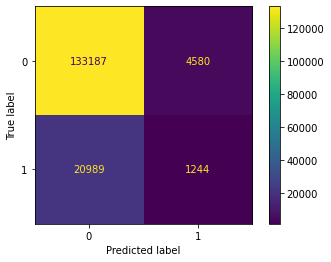

In [201]:
plot_confusion_matrix(knn, x_val, y_val)

### xgboost

In [202]:
from xgboost import XGBClassifier
from sklearn.model_selection import StratifiedKFold

In [203]:
xgb = XGBClassifier(
    n_jobs = -1, eval_metric = 'error', objective = 'binary:logistic', booster = 'gbtree',
        learning_rate = 0.02,
        max_depth = 4,
        max_leaves = 5,
        scale_pos_weight = 6.15,
        n_estimators = 200,)

In [204]:
scores = cross_val_score(xgb, x_train, y_train, cv=5, scoring='f1', verbose = 3)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV] END ................................ score: (test=0.300) total time= 1.2min


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:  1.2min remaining:    0.0s


[CV] END ................................ score: (test=0.297) total time= 1.3min


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:  2.5min remaining:    0.0s


[CV] END ................................ score: (test=0.297) total time= 1.2min
[CV] END ................................ score: (test=0.297) total time= 1.2min
[CV] END ................................ score: (test=0.296) total time= 1.2min


[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:  6.1min finished


In [205]:
scores2 = cross_val_score(xgb, x_train, y_train, cv=5, scoring='accuracy', verbose = 3)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV] END ................................ score: (test=0.639) total time= 1.3min


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:  1.3min remaining:    0.0s


[CV] END ................................ score: (test=0.642) total time= 1.3min


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:  2.6min remaining:    0.0s


[CV] END ................................ score: (test=0.638) total time= 1.3min
[CV] END ................................ score: (test=0.638) total time= 1.3min
[CV] END ................................ score: (test=0.646) total time= 1.2min


[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:  6.3min finished


In [206]:
scores

array([0.29965419, 0.29730061, 0.29707895, 0.2971634 , 0.29634777])

In [207]:
scores2

array([0.63925625, 0.6420625 , 0.6378375 , 0.63825   , 0.64561875])

In [208]:
xgb.fit(x_train_noval,y_train_noval)

XGBClassifier(eval_metric='error', learning_rate=0.02, max_depth=4,
              max_leaves=5, n_estimators=200, n_jobs=-1, scale_pos_weight=6.15)

In [209]:
y_val_pred = xgb.predict(x_val)

In [210]:
y_pred_proba_xgb = xgb.predict_proba(x_val)

In [211]:
print('xgb val f1:', f1_score(y_val, y_val_pred).round(5))
print("xgb cv f1: ", (scores.mean()).round(5))
print("xgb cv accuracy: ", (scores2.mean()).round(5))
print("xgb val accuracy: ", accuracy_score(y_val, y_val_pred))

xgb val f1: 0.29462
xgb cv f1:  0.29751
xgb cv accuracy:  0.6406
xgb val accuracy:  0.63919375


In [212]:
train_pred = xgb.predict(x_train)

In [213]:
accuracy_score(y_train, train_pred)

0.6396925

In [214]:
f1_score(y_train, train_pred)

0.29795069389981926

In [215]:
from sklearn.metrics import plot_confusion_matrix

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.



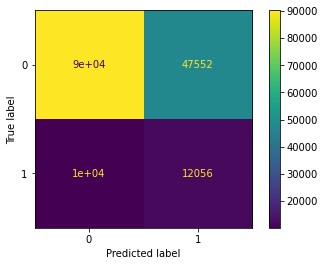

In [216]:
plot_confusion_matrix(xgb, x_val, y_val)  

### roc curve, roc-auc score

In [189]:
from sklearn.metrics import roc_curve

# roc_curve(타겟값, prob of 1)

# y_pred_proba_logi
# y_pred_proba_knn
# y_pred_proba_xgb


fpr_logi, tpr_logi, thresholds_logi = roc_curve(y_val, y_pred_proba_logi)
fpr_knn, tpr_knn, thresholds_knn = roc_curve(y_val, y_pred_proba_knn[:,1])
fpr_xgb, tpr_xgb, thresholds_xgb = roc_curve(y_val, y_pred_proba_xgb[:,1])

# roc_logi = pd.DataFrame({
#     'FPR(Fall-out)': fpr_logi, 
#     'TPR(Recall)': tpr_logi, 
#     'Threshold': thresholds_logi
# })

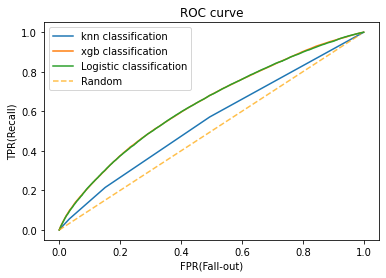

In [190]:
plt.plot(fpr_knn, tpr_knn, label='knn classification')
plt.plot(fpr_xgb, tpr_xgb, label='xgb classification')
plt.plot(fpr_logi, tpr_logi, label='Logistic classification')

x_base = np.arange(0, 1.0, 0.01)
y_base = np.arange(0, 1.0, 0.01)
plt.plot(x_base, y_base, linestyle='--', color = 'orange', alpha=0.7, label='Random')
plt.title('ROC curve')
plt.xlabel('FPR(Fall-out)')
plt.ylabel('TPR(Recall)')
plt.legend();

In [186]:
fpr_logi, tpr_logi, thresholds_logi = roc_curve(y_val, y_pred_proba_logi)
fpr_knn, tpr_knn, thresholds_knn = roc_curve(y_val, y_pred_proba_knn[:,1])
fpr_xgb, tpr_xgb, thresholds_xgb = roc_curve(y_val, y_pred_proba_xgb[:,1])

In [191]:
from sklearn.metrics import roc_auc_score

logi_auc = roc_auc_score(y_val, y_pred_proba_logi)
print(f"Logistic Classification 의 auc score : {logi_auc.round(3)}")
knn_auc = roc_auc_score(y_val, y_pred_proba_knn[:,1])
print(f"KNN Classification 의 auc score : {knn_auc.round(3)}")
xgb_auc = roc_auc_score(y_val, y_pred_proba_xgb[:,1])
print(f"XGB Classification 의 auc score : {xgb_auc.round(3)}")


Logistic Classification 의 auc score : 0.635
KNN Classification 의 auc score : 0.549
XGB Classification 의 auc score : 0.635


In [218]:
from hyperopt import hp